* This notebook was made to understand the effect of background viscosity and diffusivity on the plume.

In [1]:
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
from salishsea_tools import (nc_tools,viz_tools,tidetools,geo_tools)
import seaborn as sns
import os
%matplotlib inline
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2})

In [2]:
SITES = {
    'Sandheads': {
        'lat': 49.10,
        'lon': -123.30,
        'i' : 426,
        'j' : 293  
    },
    'VENUS East':{
        'lat' : 49.0419,
        'lon' : -123.3176,
        'depth' : 170,
        'i' : 416,
        'j' : 283
    },    
    'VENUS Central': {
        'lat': 49.0401,
        'lon': -123.4261,
        'depth' : 300,
        'i': 424,
        'j': 266
        }}

# Effect of background viscosity

In [3]:
runs=['junevis1e-5','junevis1e-4']
base='/data/jieliu/MEOPAR/parameters/'
sals={}; depths={}; Us={}; Vs={}
grid = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc')
bathy=grid.variables['Bathymetry']
for run in runs:
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_T.nc'.format(run))
    f = nc.Dataset(path,'r');
    sals[run]=f.variables['vosaline']
    depths[run] = f.variables['deptht'] 
    T_lat = f.variables['nav_lat']
    T_lon = f.variables['nav_lon']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_U.nc'.format(run))
    f = nc.Dataset(path,'r');
    Us[run]=f.variables['vozocrtx']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_V.nc'.format(run))
    f = nc.Dataset(path,'r');
    Vs[run]=f.variables['vomecrty']

In [11]:
def quiver_salinity(t,dep,imin=1,imax=396,jmin=1,jmax=896,st=5,cmin= -4, cmax=4, dels = 0.4):
    "compare rivers and salinity at t, dep in box. st is quiver arrow interval"
    fig,axs = plt.subplots(1,3,figsize=(16,6))
    x=np.arange(imin,imax)
    y=np.arange(jmin,jmax)
    U={}; V={};u={};v={};uE={};vN={};
    for key, ax in zip(runs,axs[:-1]):
        #truncate U/V and unstagger
        U[key]= Us[key][t,dep,jmin-1:jmax,imin-1:imax]
        V[key] =Vs[key][t,dep,jmin-1:jmax,imin-1:imax]
        lon=T_lon[jmin:jmax,imin:imax]
        lat=T_lat[jmin:jmax,imin:imax]
        S=sals[key][t,dep,jmin:jmax,imin:imax]
        #masking
        U[key] = np.ma.masked_values(U[key],0)
        V[key] = np.ma.masked_values(V[key],0)
        #unstagger
        u[key],v[key] = viz_tools.unstagger(U[key],V[key])
        #rotate
        theta = np.pi*29/180
        uE[key] = u[key]*np.cos(theta) - v[key]*np.sin(theta)
        vN[key] = u[key]*np.sin(theta) +v[key]*np.cos(theta)
        #mesh
        mesh=ax.pcolormesh(lon,lat,S,cmap='plasma_r')
        viz_tools.plot_land_mask(ax,grid,coords='map',color='burlywood')
        #quivers
        quiver = ax.quiver(lon[::st,::st],lat[::st,::st],uE[key][::st,::st], vN[key][::st,::st],
                       pivot='mid', scale = 5, color='white',width=0.005)
        ax.quiverkey(quiver,-123.9,49., 1,'1 m/s',
                 coordinates='data', color='black', labelcolor='black',\
                    fontproperties = {'size': '15'})
        cbar = plt.colorbar(mesh,ax=ax)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k')
        cbar.set_label('Practical Salinity')
        ax.set_xlim([-124,-122.8])
        ax.set_ylim([48.9,49.4])
        ax.set_title(key)
    ##plot difference
    ax = axs[-1]
    sal_diff = sals[runs[0]][t,dep,jmin:jmax,imin:imax] - sals[runs[1]][t,dep,jmin:jmax,imin:imax]
    U_diff = uE[runs[0]] - uE[runs[1]]
    V_diff = vN[runs[0]] - vN[runs[1]]
    mesh=ax.pcolormesh(lon,lat,sal_diff,cmap='RdBu_r',vmin=cmin, vmax=cmax)
    quiver = ax.quiver(lon[::st,::st], lat[::st,::st],U_diff[ ::st, ::st], V_diff[::st,::st],\
                           pivot='mid',scale=5, width=0.005, color='black' )
    ax.quiverkey(quiver,-123.9,49., 1, '1 m/s',
                        coordinates='data', color='black', labelcolor='black',
                    fontproperties = {'size': '15'})
    viz_tools.plot_land_mask(ax,grid,coords='map',xslice=x,yslice=y,color='burlywood')
    cbar = plt.colorbar(mesh, ax=ax)
    plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k')
    cbar.set_label(' Salinity difference')
    ax.set_title(str(runs[0])+'-'+str(runs[1]))
    ax.set_xlim([-124,-122.8])
    ax.set_ylim([48.9,49.4])
    return fig  

# Surface layer (change in viscosity)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


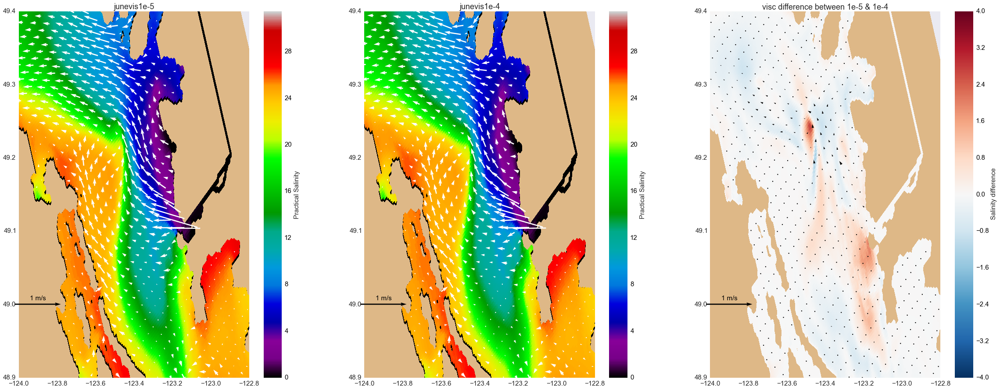

In [5]:
## start day & surface currents
t=0; dep=0
fig=quiver_salinity(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


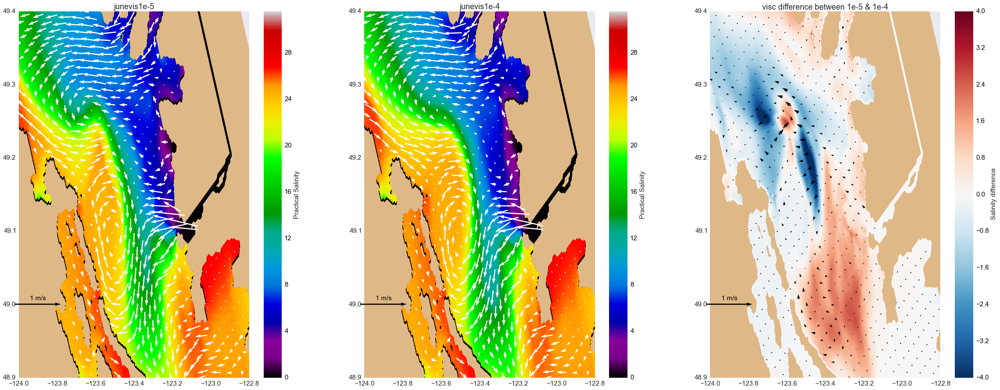

In [6]:
## middle of this period & surface currents
t=14; dep=0
fig=quiver_salinity(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


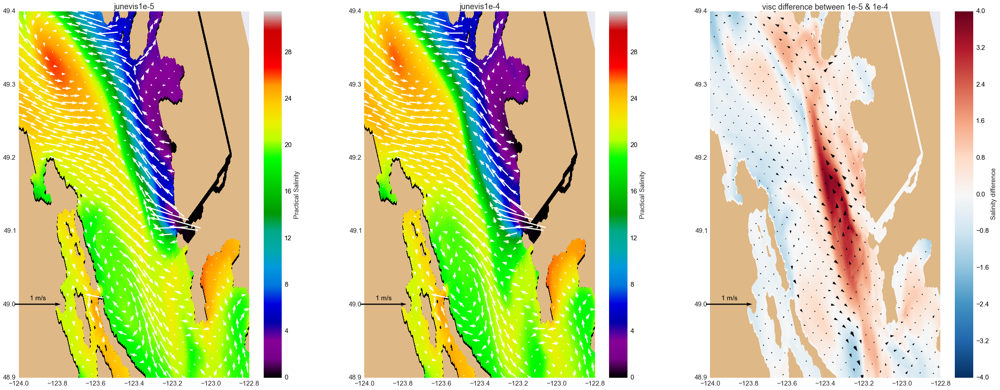

In [7]:
## end of this period & surface currents
t=29; dep=0
fig=quiver_salinity(t,dep)

* With reduced background viscosity, we have saltier surface layer in the plume, which should be caused by strong shear between surface and lower layer, that induced mixing vertically??
* Middle day of this simulation, much fresher water was found in the northern strait and gradually fade by end of simulation day.

* Similar salinity difference pattern with that for surface layer, but the magnitude is reduced, which means strong vertical mixing occurs at the very surface layer.
* I haven't seen much currents difference between different viscos. And it seems contradict with what Nancy did:
http://nbviewer.ipython.org/urls/bitbucket.org/salishsea/analysis/raw/tip/Nancy/strat/Eddy%20values%20at%20VENUS%20nodes.ipynb

# Average of upper 3 m

In [14]:
def quiver_salinity_average(t,imin=1,imax=396,jmin=1,jmax=896,st=5,cmin= -4, cmax=4, dels = 0.4):
    "compare rivers and salinity at averaged 3m depth in box. st is quiver arrow interval"
    fig,axs = plt.subplots(1,3,figsize=(40,15))
    x=np.arange(imin,imax)
    y=np.arange(jmin,jmax)
    U={}; V={};u={};v={};uE={};vN={};
    for key, ax in zip(runs,axs[:-1]):
        #truncate U/V and unstagger
        U[key]= np.nanmean(Us[key][t, 0:3,jmin-1:jmax,imin-1:imax],axis =0)
        V[key] =np.nanmean(Vs[key][t,0:3,jmin-1:jmax,imin-1:imax],axis = 0)
        lon=T_lon[jmin:jmax,imin:imax]
        lat=T_lat[jmin:jmax,imin:imax]
        S=np.nanmean(sals[key][t,0:3,jmin:jmax,imin:imax],axis = 0)
        #masking
        U[key] = np.ma.masked_values(U[key],0)
        V[key] = np.ma.masked_values(V[key],0)
        #unstagger
        u[key],v[key] = viz_tools.unstagger(U[key],V[key])
        #rotate
        theta = np.pi*29/180
        uE[key] = u[key]*np.cos(theta) - v[key]*np.sin(theta)
        vN[key] = u[key]*np.sin(theta) +v[key]*np.cos(theta)
        #mesh
        mesh=ax.pcolormesh(lon,lat,S,cmap='spectral')
        viz_tools.plot_land_mask(ax,grid,coords='map',color='burlywood')
        #quivers
        quiver = ax.quiver(lon[::st,::st],lat[::st,::st],uE[key][::st,::st], vN[key][::st,::st],
                       pivot='mid', scale = 5, color='white',width=0.005)
        ax.quiverkey(quiver,-123.9,49., 1,'1 m/s',
                 coordinates='data', color='black', labelcolor='black',\
                    fontproperties = {'size': '15'})
        cbar = plt.colorbar(mesh,ax=ax)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k')
        cbar.set_label('Practical Salinity')
        ax.set_xlim([-124,-122.8])
        ax.set_ylim([48.9,49.4])
        plt.setp(ax.get_xticklabels())
        plt.setp(ax.get_yticklabels())
        ax.set_title(key , fontsize = 18)
    ##plot difference
    ax = axs[-1]
    sal_diff =np.nanmean(sals[runs[0]][t,0:3,jmin:jmax,imin:imax],axis = 0) - \
    np.nanmean(sals[runs[1]][t,0:3,jmin:jmax,imin:imax],axis = 0)
    U_diff = uE[runs[0]] - uE[runs[1]]
    V_diff = vN[runs[0]] - vN[runs[1]]
    mesh=ax.pcolormesh(lon,lat,sal_diff,cmap='RdBu_r',vmin=cmin, vmax=cmax)
    quiver = ax.quiver(lon[::st,::st], lat[::st,::st],U_diff[ ::st, ::st], V_diff[::st,::st],\
                           pivot='mid',scale=5, width=0.005, color='black' )
    ax.quiverkey(quiver,-123.9,49., 1, '1 m/s',coordinates='data', color='black', labelcolor='black',
                    fontproperties = {'size': '15'})
    viz_tools.plot_land_mask(ax,grid,coords='map',xslice=x,yslice=y,color='burlywood')
    cbar = plt.colorbar(mesh, ax=ax)
    plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 15)
    cbar.set_label(' Salinity difference')
    plt.setp(ax.get_xticklabels())
    plt.setp(ax.get_yticklabels())
    ax.set_title('visc difference between 1e-5 & 1e-4')
    ax.set_xlim([-124,-122.8])
    ax.set_ylim([48.9,49.4])
    return fig  

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


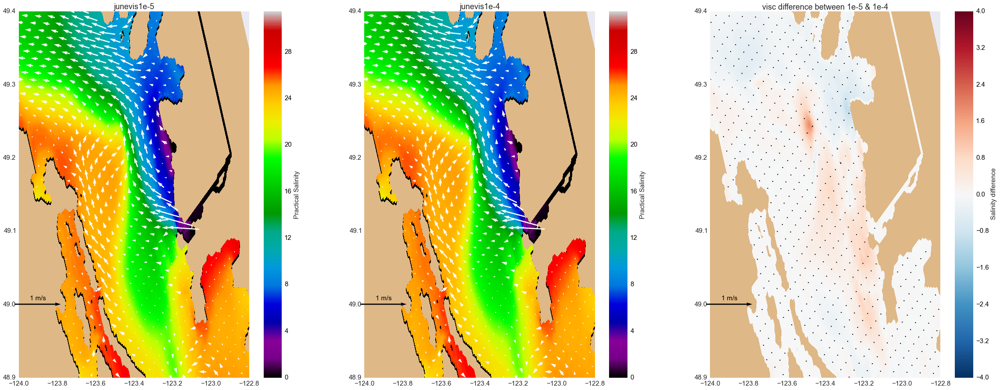

In [15]:
#start day
t=0;
fig=quiver_salinity_average(t)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


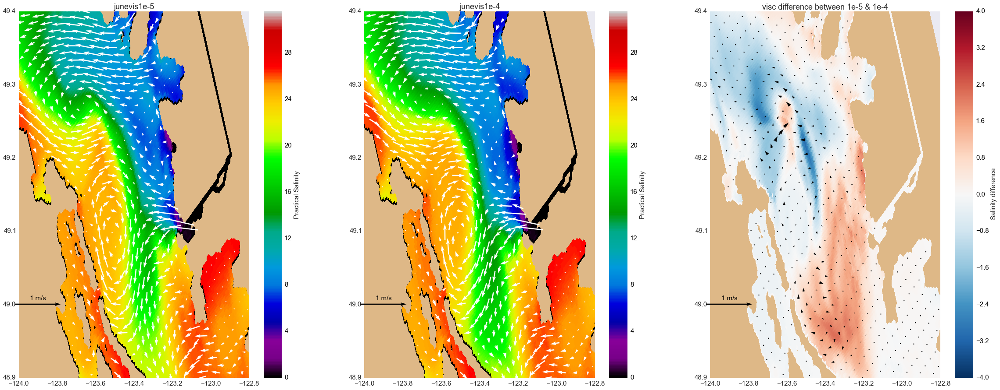

In [16]:
#middle day
t=14;
fig=quiver_salinity_average(t)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


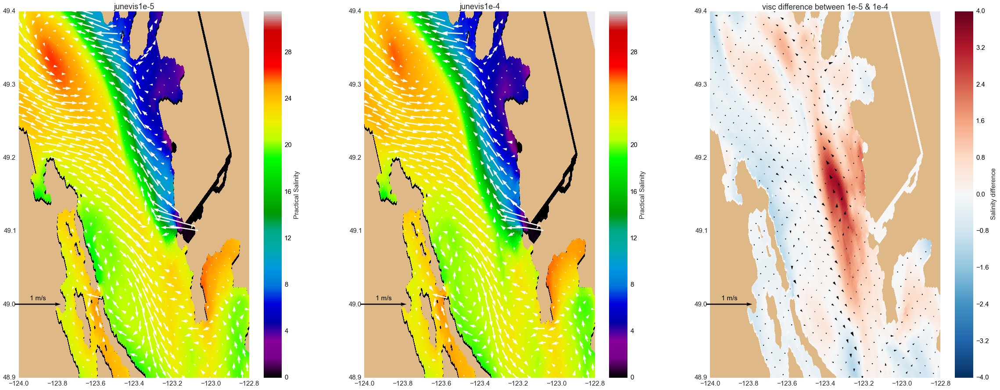

In [17]:
#end day
t=29;
fig=quiver_salinity_average(t)

# Effect of background diffusivity

In [5]:
runs=['junediff1e-6','junediff1e-5']
base='/data/jieliu/MEOPAR/parameters/'
sals={}; depths={}; Us={}; Vs={}
grid = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc')
bathy=grid.variables['Bathymetry']
for run in runs:
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_T.nc'.format(run))
    f = nc.Dataset(path,'r');
    sals[run]=f.variables['vosaline']
    depths[run] = f.variables['deptht'] 
    T_lat = f.variables['nav_lat']
    T_lon = f.variables['nav_lon']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_U.nc'.format(run))
    f = nc.Dataset(path,'r');
    Us[run]=f.variables['vozocrtx']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_V.nc'.format(run))
    f = nc.Dataset(path,'r');
    Vs[run]=f.variables['vomecrty']

In [6]:
runs=['oct1e061e05','oct1e05']
base='/data/jieliu/MEOPAR/IOS/'
sals={}; depths={}; Us={}; Vs={}
grid = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc')
bathy=grid.variables['Bathymetry']
for run in runs:
    path = os.path.join(base,'{}/SalishSea_1d_20141001_20141030_grid_T.nc'.format(run))
    f = nc.Dataset(path,'r');
    sals[run]=f.variables['vosaline']
    depths[run] = f.variables['deptht'] 
    T_lat = f.variables['nav_lat']
    T_lon = f.variables['nav_lon']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20141001_20141030_grid_U.nc'.format(run))
    f = nc.Dataset(path,'r');
    Us[run]=f.variables['vozocrtx']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20141001_20141030_grid_V.nc'.format(run))
    f = nc.Dataset(path,'r');
    Vs[run]=f.variables['vomecrty']

/ocean/jieliu/Anaconda/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


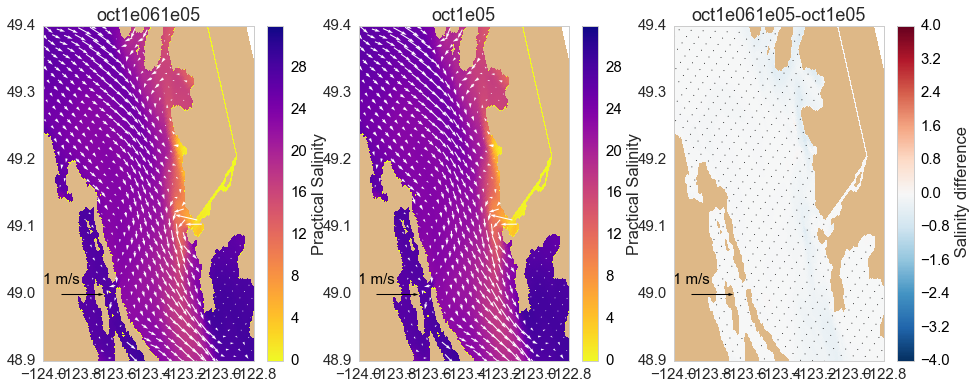

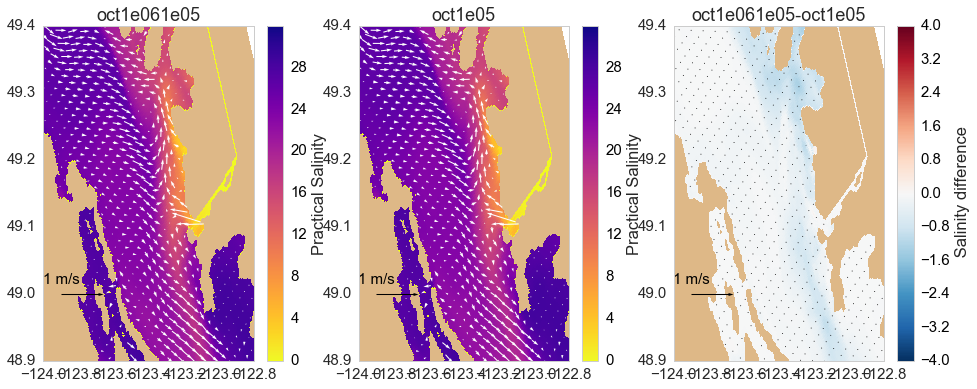

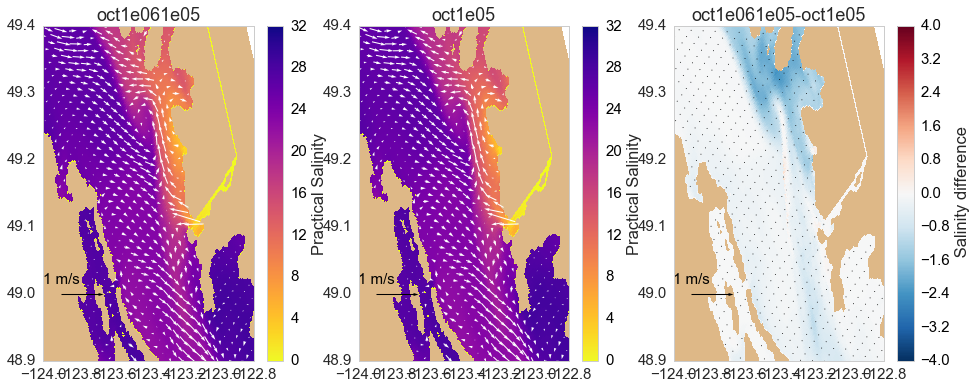

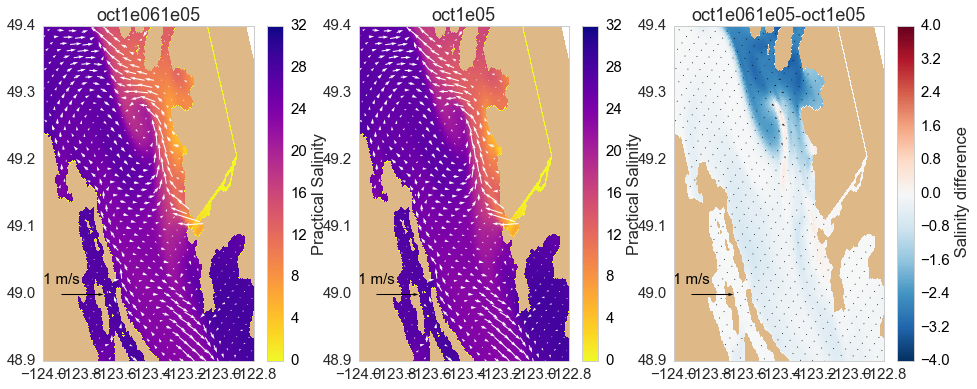

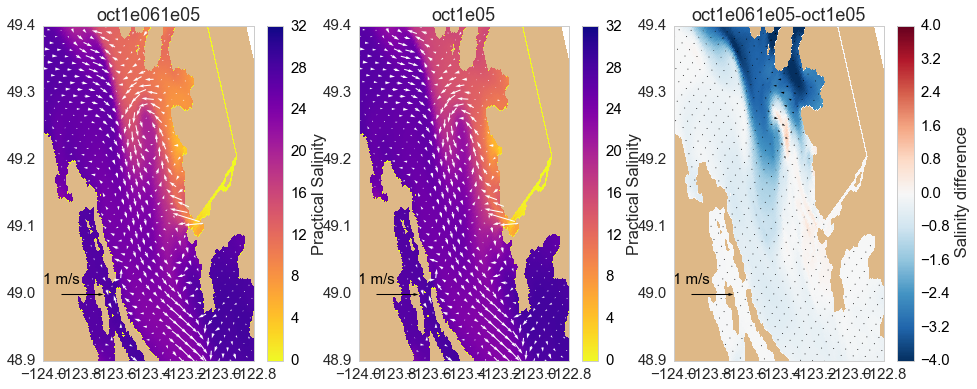

...

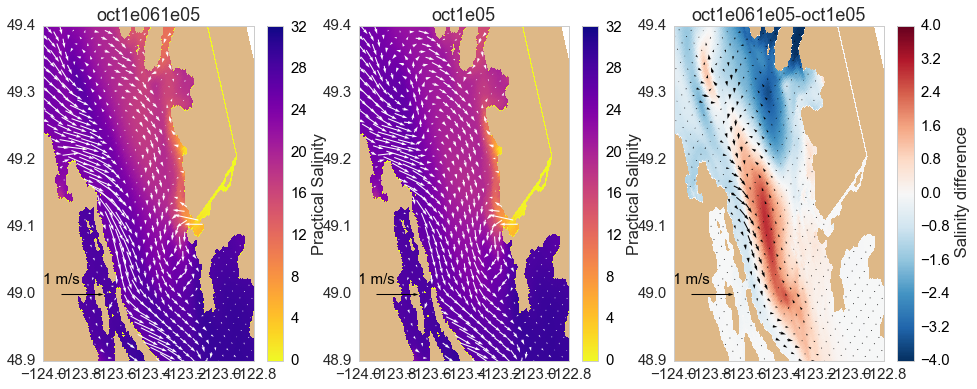

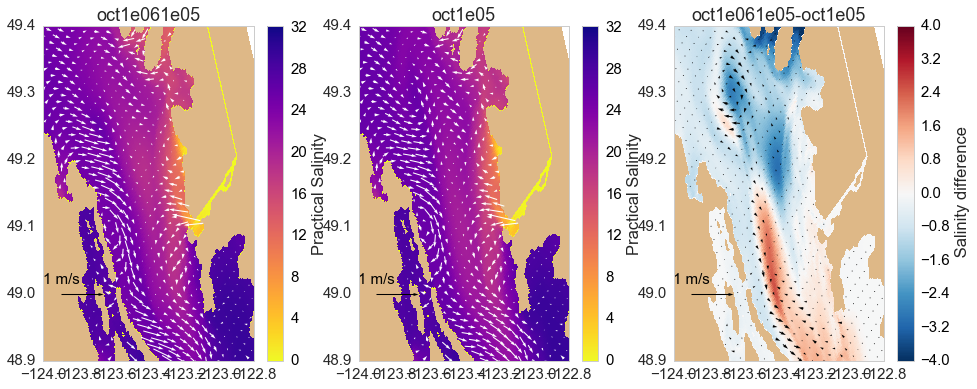

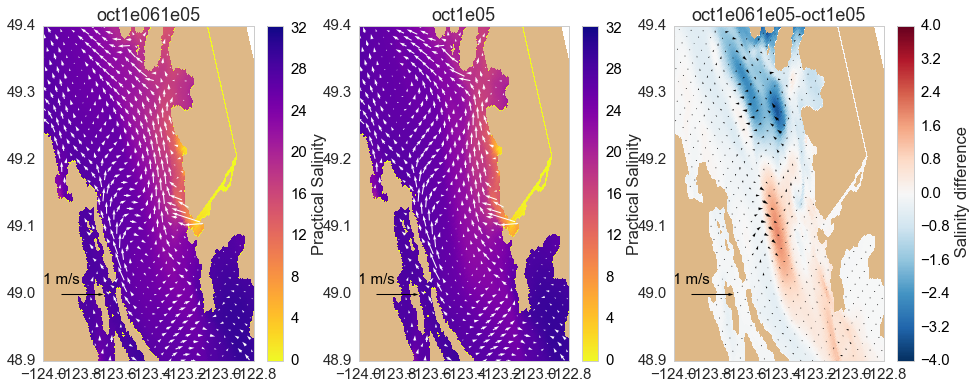

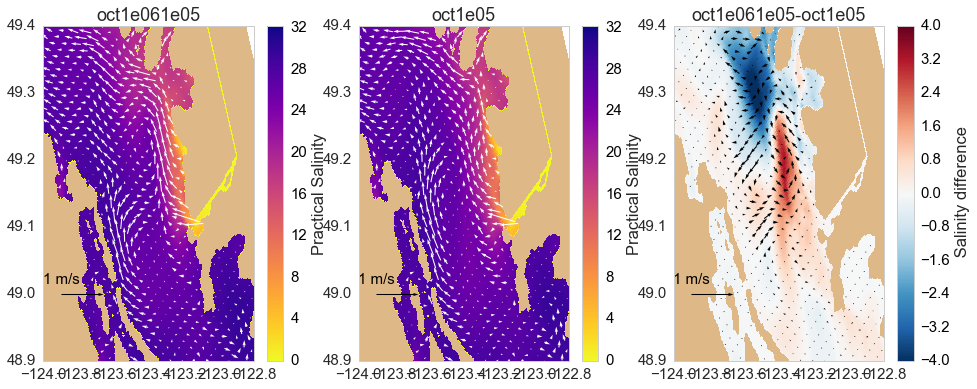

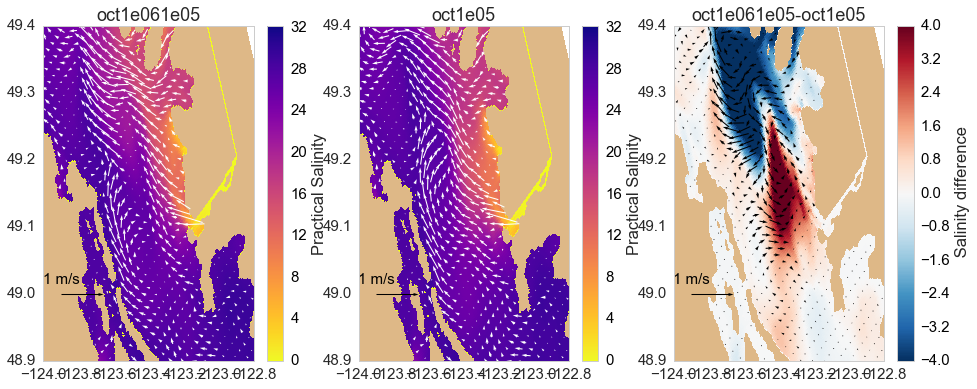

In [12]:
dep=0
for t in range(30):
    fig=quiver_salinity(t,dep)

# Surface layer (only change in diffusivity)


/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


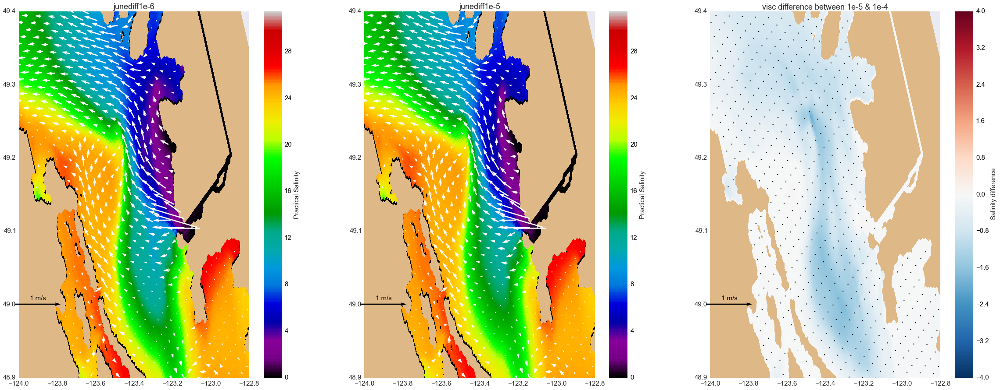

In [19]:
## start day & surface currents
t=0; dep=0
fig=quiver_salinity(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


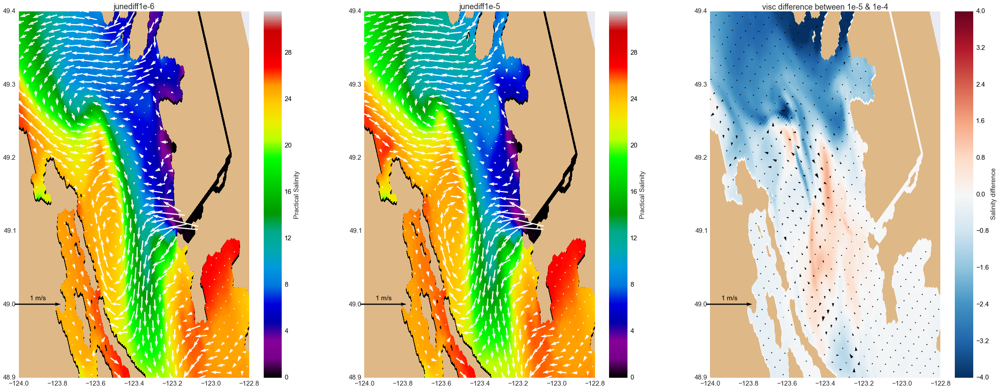

In [20]:
## middle of this period & surface currents
t=14; dep=0
fig=quiver_salinity(t,dep)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


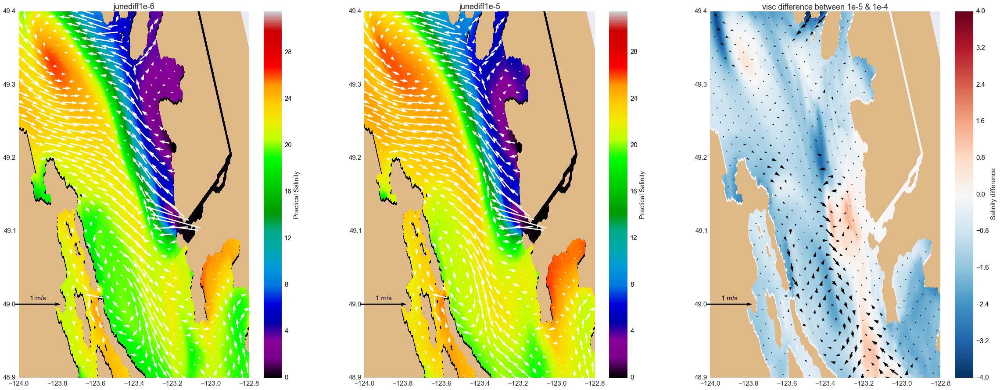

In [21]:
## end of this period & surface currents
t=29; dep=0
fig=quiver_salinity(t,dep)

# Average of 3 m depth

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


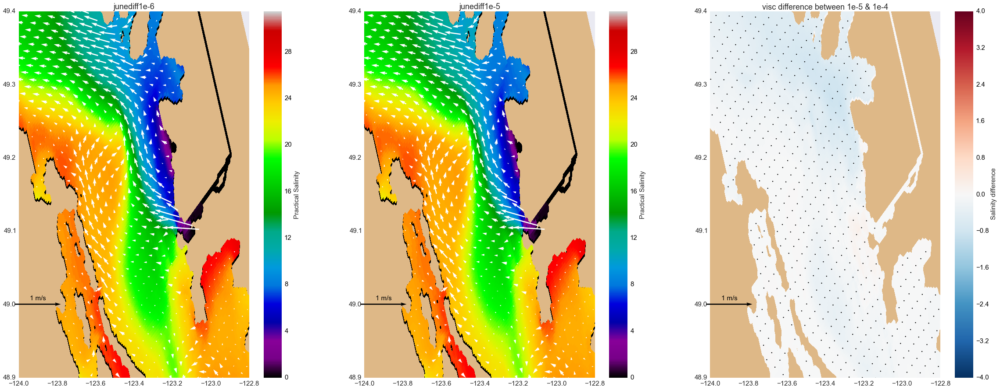

In [28]:
#start day
t=0;
fig=quiver_salinity_average(t)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


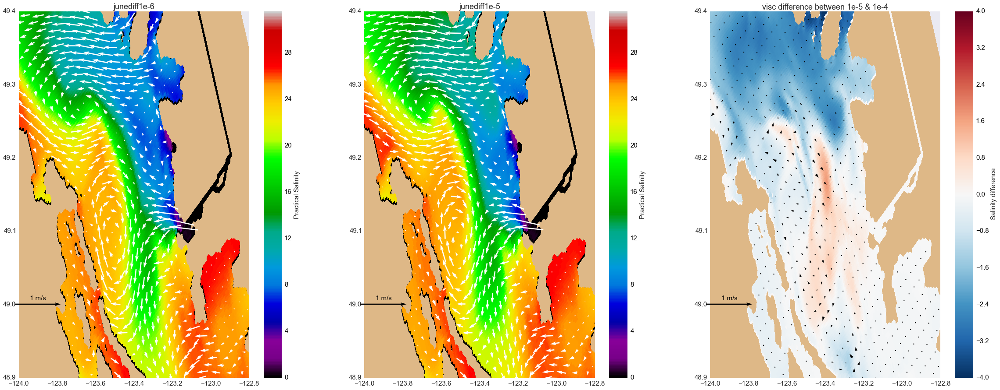

In [29]:
#middle day
t=14;
fig=quiver_salinity_average(t)

/home/jieliu/anaconda3/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


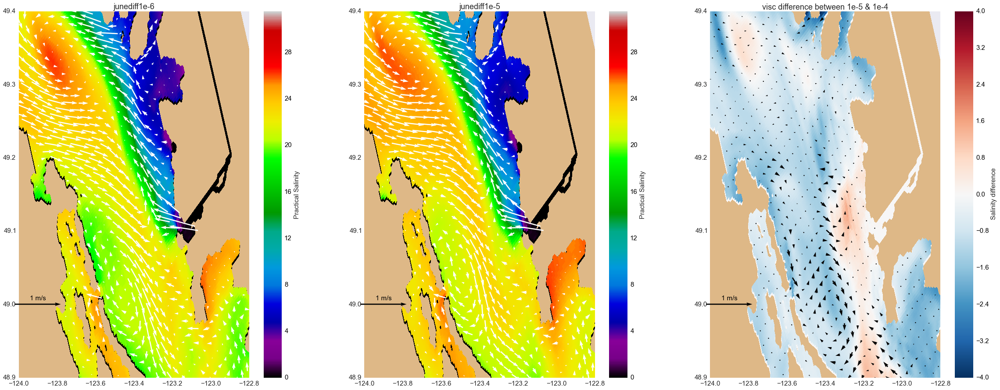

In [30]:
#end day
t=29;
fig=quiver_salinity_average(t)

* By reducing background vertical eddy diffusivity, most of the regions in the strait become fresher. It seems like the fresh area expands to the south with time accumulation.

# Comparisons between background values and gls values

In [31]:
runs=['junevis1e-4','junevis1e-5']
base='/data/jieliu/MEOPAR/parameters/'
sals={}; depths={}; avms={}; avds={}; Ws={};depthws={}; Us={}; Vs={}
grid = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc')
bathy=grid.variables['Bathymetry']
for run in runs:
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_T.nc'.format(run))
    f = nc.Dataset(path,'r');
    sals[run]=f.variables['vosaline']
    depths[run] = f.variables['deptht'] 
    T_lat = f.variables['nav_lat']
    T_lon = f.variables['nav_lon']

    #Loading eddy viscosity/diffusivity data on the vertical grid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_W.nc'.format(run))
    f = nc.Dataset(path,'r');
    avms[run]=f.variables['ve_eddy_visc']
    avds[run]= f.variables['ve_eddy_diff'] #
    Ws[run]=f.variables['vovecrtz']
    depthws[run] = f.variables['depthw']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_U.nc'.format(run))
    f = nc.Dataset(path,'r');
    Us[run]=f.variables['vozocrtx']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_V.nc'.format(run))
    f = nc.Dataset(path,'r');
    Vs[run]=f.variables['vomecrty']

In [32]:
bg = {runs[0]: {'visc': 1e-4, 'diff': 1e-5},
      runs[1]: {'visc': 1e-5, 'diff': 1e-5}
      }

In [33]:
def compare_visc_diff(j, i,station,zmin=0, zmax=50, xmin=-7,xmax=-2):
    """Compare vertical eddy diff and viscosity at time t and gridpoint (i,j)"""
    
    colors=['b','g']
    fig, axs = plt.subplots(1,2,figsize=(15,3))
    for run, c in zip(runs, colors):
        #diff
        title = ' Diffusivity averaged over 30 days with hourly results - {}'.format( station )
        ax=axs[0]
        avd=avds[run][:,:,j,i]
        avd=np.nanmean(np.ma.masked_values(avd,0),axis=0)
        ax.plot(np.log10(avd),depthws[run],'-o',label=run,color=c)
        ax.plot(np.log10([bg[run]['diff'], bg[run]['diff']]), [depthws[run][0], depthws[run][-1]],
                '--', color=c, label='background')
        ax.set_xlabel('Log base 10 of diffusivity (m^2/s)')
        ax.set_title(title)
        
        #visc
        title = ' Viscosity averaged over 30 days with hourly results  - {}'.format(station )
        ax=axs[1]
        avm=avms[run][:,:,j,i]
        avm=np.nanmean(np.ma.masked_values(avm,0),axis=0)
        ax.plot(np.log10(avm),depthws[run],'-o',label=run,color=c)
        ax.plot(np.log10([bg[run]['visc'], bg[run]['visc']]), [depthws[run][0], depthws[run][-1]],
                '--', color=c, label='background')
        ax.set_xlabel('Log base 10 of Viscosity (m^2/s)')
        ax.set_title(title)

    for ax in axs:
        ax.legend(loc=0)
        ax.set_ylabel('Depth [m]')
        ax.set_xlim([xmin, xmax])
        ax.set_ylim([zmax,zmin])
    
    return fig

# Viscosity

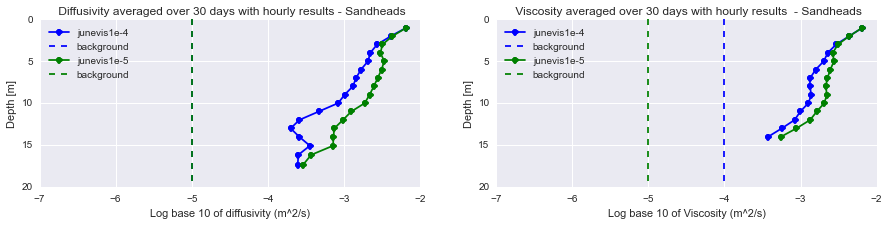

In [34]:
site='Sandheads'
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site,zmin=0, zmax=20)

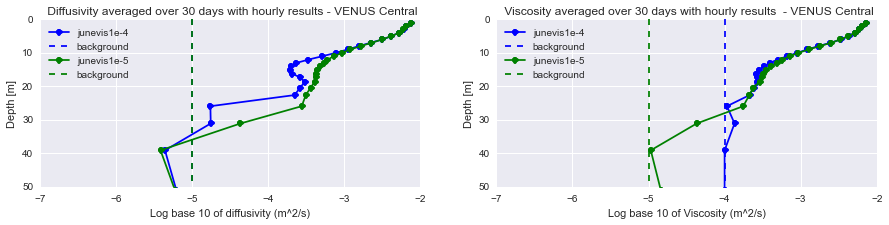

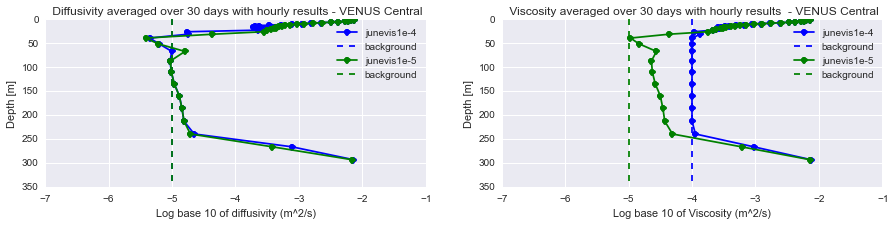

In [35]:
site='VENUS Central'
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site,zmin=0, zmax=50)
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site, zmin=0, zmax=350,xmin=-7,xmax=-1)

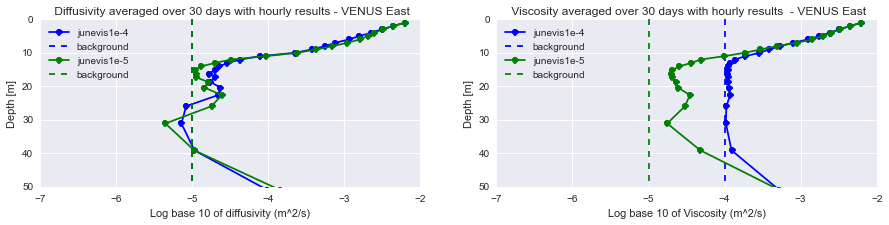

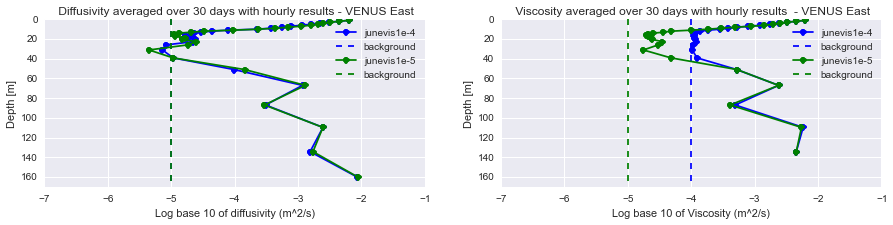

In [36]:
site='VENUS East'
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site,zmin=0, zmax=50)
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site, zmin=0, zmax=170,xmin=-7,xmax=-1)

# Diffusivity

In [37]:
runs=['junediff1e-5','junediff1e-6']
base='/data/jieliu/MEOPAR/parameters/'
sals={}; depths={}; avms={}; avds={}; Ws={};depthws={}; Us={}; Vs={}
grid = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc')
bathy=grid.variables['Bathymetry']
for run in runs:
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_T.nc'.format(run))
    f = nc.Dataset(path,'r');
    sals[run]=f.variables['vosaline']
    depths[run] = f.variables['deptht'] 
    T_lat = f.variables['nav_lat']
    T_lon = f.variables['nav_lon']

    #Loading eddy viscosity/diffusivity data on the vertical grid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_W.nc'.format(run))
    f = nc.Dataset(path,'r');
    avms[run]=f.variables['ve_eddy_visc']
    avds[run]= f.variables['ve_eddy_diff'] #
    Ws[run]=f.variables['vovecrtz']
    depthws[run] = f.variables['depthw']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_U.nc'.format(run))
    f = nc.Dataset(path,'r');
    Us[run]=f.variables['vozocrtx']
    #Loading data on the ugrid
    path = os.path.join(base,'{}/SalishSea_1d_20150601_20150630_grid_V.nc'.format(run))
    f = nc.Dataset(path,'r');
    Vs[run]=f.variables['vomecrty']

In [38]:
bg = {runs[0]: {'visc': 1e-5, 'diff': 1e-5},
      runs[1]: {'visc': 1e-5, 'diff': 1e-6}
      }

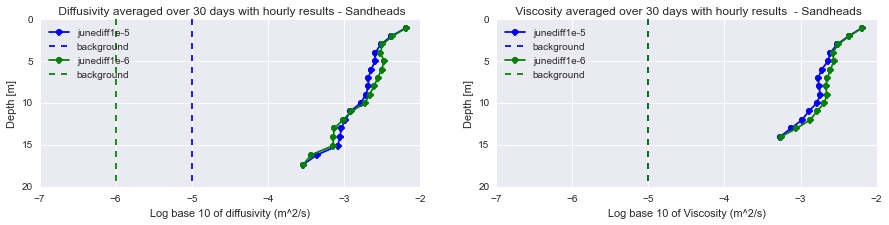

In [39]:
site='Sandheads'
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site,zmin=0, zmax=20)

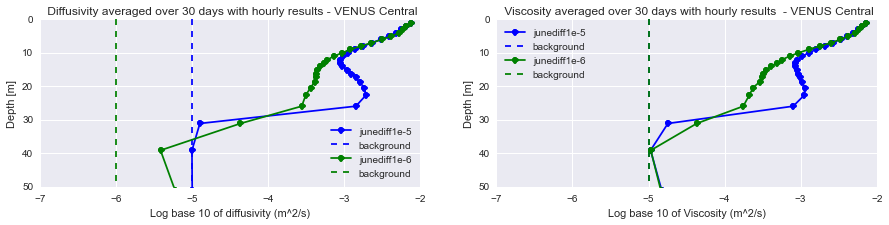

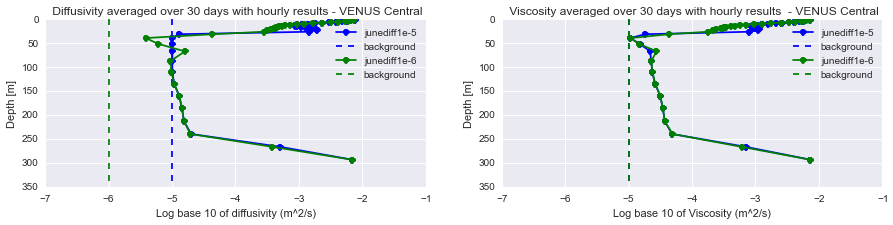

In [40]:
site='VENUS Central'
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site,zmin=0, zmax=50)
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site, zmin=0, zmax=350,xmin=-7,xmax=-1)

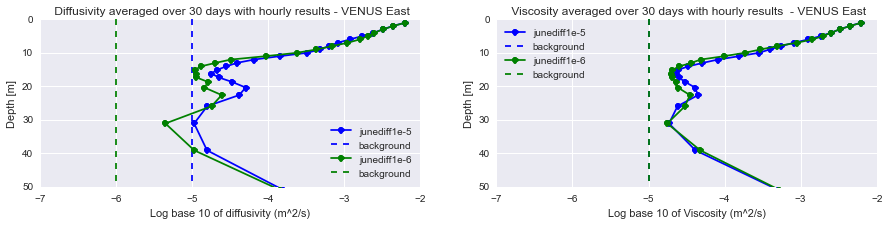

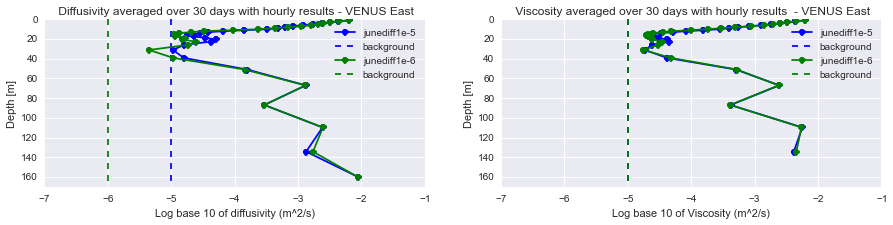

In [41]:
site='VENUS East'
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site,zmin=0, zmax=50)
fig =compare_visc_diff(SITES[site]['i'], SITES[site]['j'],site, zmin=0, zmax=170,xmin=-7,xmax=-1)